https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Crashes/h9gi-nx95?fbclid=IwAR3WB8cL1Qk7icQgbjaj8rw3iGGjo8M4wRIiEAb3zZC8anTow9uV4IvxTcU
https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Vehicles/bm4k-52h4?fbclid=IwAR17Ba6CEepQQTKNt5qIB-p2QQmSWS8HrTei1kygpXaWkKQeutg3IPGVjuo
https://data.cityofnewyork.us/Public-Safety/Motor-Vehicle-Collisions-Person/f55k-p6yu?fbclid=IwAR1k9QCQYOXIHXw061OGsCp0kmBlFOrSl310kjpSIpp2CYdgVb6odkgNm20

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import shapefile as shp
import urllib, gdal, subprocess
import json
import requests
import folium
import datetime
import warnings
import random
warnings.filterwarnings("ignore")

sns.set(style='darkgrid', palette='muted', color_codes=True)
#sns.mpl.rc('figure', figsize=(10,6))
# Set a plot style for nice plots.

# Magic command useful jupyter notebook
%matplotlib inline



#Set font size
plt.rcParams.update({'font.size':16})

## Merge dataset

In [3]:
df_crash = pd.read_csv('crash_clean.csv')
# df_vehicle = pd.read_csv('data/vehicle_clean.csv')
df_persons = pd.read_csv('people_clean.csv')

In [4]:
df_crash

,Unnamed: 0,CRASH DATE,CRASH TIME,BOROUGH,LATITUDE,LONGITUDE,ON STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,NUMBER OF PEDESTRIANS KILLED,NUMBER OF CYCLIST INJURED,NUMBER OF CYCLIST KILLED,NUMBER OF MOTORIST INJURED,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,COLLISION_ID,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2
0,1,06/01/2016,13:54,QUEENS,40.655834,-73.839035,CROSS BAY BOULEVARD,0.0,0.0,0,0,0,0,0,0,Driver Inattention/Distraction,Driver Inattention/Distraction,3453947,PASSENGER VEHICLE,PASSENGER VEHICLE
1,2,05/23/2016,6:15,Unspecified,40.752937,-73.922040,NORTHERN BOULEVARD,0.0,0.0,0,0,0,0,0,0,Driver Inattention/Distraction,Unspecified,3452402,PASSENGER VEHICLE,PASSENGER VEHICLE
2,3,06/03/2016,11:00,Unspecified,40.680893,-73.871376,GLEN STREET,1.0,0.0,1,0,0,0,0,0,Failure to Yield Right-of-Way,Unspecified,3482311,PASSENGER VEHICLE,Unspecified
3,4,06/03/2016,17:15,QUEENS,40.665558,-73.729850,HOOK CREEK BOULEVARD,0.0,0.0,0,0,0,0,0,0,Unspecified,Unspecified,3455499,PASSENGER VEHICLE,PASSENGER VEHICLE
4,5,06/04/2016,13:20,BROOKLYN,40.689530,-73.909134,Unspecified,0.0,0.0,0,0,0,0,0,0,Passing Too Closely,Unspecified,3455042,PASSENGER VEHICLE,PASSENGER VEHICLE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1469479,1672211,10/11/2013,14:00,Unspecified,40.726510,-73.930540,Unspecified,3,0,0,0,0,0,3,0,Turning Improperly,Unspecified,2992369,VAN,PASSENGER VEHICLE
1469480,1672245,10/01/2013,15:00,Unspecified,40.847461,-73.944234,Unspecified,1,0,0,0,0,0,1,0,Unspecified,Unspecified,2873364,MOTORCYCLE,Unspecified
1469481,1672320,09/08/2013,17:00,Unspecified,40.666094,-73.795390,Unspecified,1,0,0,0,0,0,1,0,Unspecified,Unspecified,3097335,PASSENGER VEHICLE,MOTORCYCLE
1469482,1672349,08/28/2013,12:15,Unspecified,40.874499,-73.927609,Unspecified,0,0,0,0,0,0,0,0,Physical Disability,Unspecified,2874805,BUS,Unspecified


In [5]:
df_crash['CRASH DATE'] = pd.to_datetime(df_crash['CRASH DATE'],errors='coerce')
df_crash['CRASH TIME'] = pd.to_datetime(df_crash['CRASH TIME'],errors='coerce')

In [6]:
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('TAXI','Taxi')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('SPORT UTILITY / STATION WAGON','Station Wagon')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Station Wagon/Sport Utility Vehicle','Station Wagon')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('4 dr sedan','Sedan')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('2 dr sedan','Sedan')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('VAN','Van')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('van','Van')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('VN','Van')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('MOTORCYCLE','Motorcycle')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Motorbike','Motorcycle')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('ambul','Ambulance')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Ambul','Ambulance')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('AMBUL','Ambulance')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('AmbulanceANCE','Ambulance')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Ambulanceance','Ambulance')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('AM','Ambulance')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Fire','Firetruck')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('FIRE','Firetruck')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('FIRE TRUCK','Firetruck') 
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Firetruck TRUCK','Firetruck')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('BUS','Bus')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('BU','Bus')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('BICYCLE','Bicycle')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('Bike','Bicycle')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('PICK-UP TRUCK','Pick-up Truck')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('TK','Pick-up Truck')
df_crash['VEHICLE TYPE CODE 1'] = df_crash['VEHICLE TYPE CODE 1'].str.replace('LIVERY VEHICLE','Livery Vehicle')

In [7]:
df_sort = df_persons.groupby(['COLLISION_ID','PERSON_TYPE'],as_index=False).agg({'PERSON_AGE': ['min', 'max'],'PERSON_SEX': ['first','last']})

In [8]:
df_sort2 = df_sort

In [9]:
df_sort2 = df_sort2[df_sort2['COLLISION_ID'].notnull() == True].set_index('COLLISION_ID')
df_crash2 = df_crash[df_crash['COLLISION_ID'].notnull() == True].set_index('COLLISION_ID')

In [10]:
df_merged = pd.merge(df_crash2,df_sort2, how='inner', left_index=True, right_index=True)

In [11]:
df_merged = df_merged.rename(columns = {df_merged.columns[-1] : 'PERSON_SEX2'})
df_merged = df_merged.rename(columns = {df_merged.columns[-2] : 'PERSON_SEX1'})
df_merged = df_merged.rename(columns = {df_merged.columns[-3] : 'PERSON_AGE2'})
df_merged = df_merged.rename(columns = {df_merged.columns[-4] : 'PERSON_AGE1'})
df_merged = df_merged.rename(columns = {df_merged.columns[-5] : 'PERSON_TYPE'})

In [12]:
df_merged

,Unnamed: 0,CRASH DATE,CRASH TIME,BOROUGH,LATITUDE,LONGITUDE,ON STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,...,NUMBER OF MOTORIST KILLED,CONTRIBUTING FACTOR VEHICLE 1,CONTRIBUTING FACTOR VEHICLE 2,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,PERSON_TYPE,PERSON_AGE1,PERSON_AGE2,PERSON_SEX1,PERSON_SEX2
COLLISION_ID,,,,,,,,,,,,,,,,,,,,,
37,1569206,2012-07-02,2020-05-08 00:19:00,MANHATTAN,40.713692,-74.013754,VESEY STREET,1,0,0,...,0,Unspecified,Unspecified,PASSENGER VEHICLE,BICYCLE,Bicyclist,20.0,20.0,U,U
39,1572216,2012-07-02,2020-05-08 14:15:00,MANHATTAN,40.720376,-74.003261,CANAL STREET,1,0,0,...,0,Unspecified,Unspecified,Station Wagon,BICYCLE,Bicyclist,23.0,23.0,U,U
40,1569793,2012-07-02,2020-05-08 14:25:00,MANHATTAN,40.720376,-74.003261,CANAL STREET,1,0,0,...,0,Unspecified,Unspecified,Van,BICYCLE,Bicyclist,56.0,56.0,U,U
44,1571951,2012-07-02,2020-05-08 18:01:00,MANHATTAN,40.714165,-74.006309,CHAMBERS STREET,1,0,1,...,0,Unspecified,Unspecified,PASSENGER VEHICLE,Unspecified,Pedestrian,36.0,36.0,U,U
52,1568370,2012-07-03,2020-05-08 10:00:00,MANHATTAN,40.725989,-74.009095,SPRING STREET,1,0,0,...,0,Unspecified,Unspecified,Taxi,BICYCLE,Bicyclist,28.0,28.0,U,U
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4308998,63002,2020-04-13,2020-05-08 21:30:00,QUEENS,40.661587,-73.740330,CANEY ROAD,0,0,0,...,0,Other Vehicular,Unspecified,Sedan,Sedan,Occupant,23.0,Unspecified,U,U
4309021,59894,2020-04-13,2020-05-08 09:00:00,Unspecified,40.814170,-73.921220,3 AVENUE,0,0,0,...,0,Following Too Closely,Unspecified,Station Wagon,Sedan,Occupant,49.0,Unspecified,F,F
4309026,60365,2020-04-10,2020-05-08 13:00:00,Unspecified,40.702362,-73.912910,SAINT NICHOLAS AVENUE,1,0,0,...,0,Traffic Control Disregarded,Unspecified,Sedan,Sedan,Occupant,47.0,Unspecified,F,F


In [13]:
df_merged['tod']=df_merged['CRASH TIME'].dt.hour
df_merged['dow']=df_merged['CRASH DATE'].dt.dayofweek

In [246]:
df_merged

,Unnamed: 0,CRASH DATE,CRASH TIME,BOROUGH,LATITUDE,LONGITUDE,ON STREET NAME,NUMBER OF PERSONS INJURED,NUMBER OF PERSONS KILLED,NUMBER OF PEDESTRIANS INJURED,...,VEHICLE TYPE CODE 1,VEHICLE TYPE CODE 2,PERSON_TYPE,PERSON_AGE1,PERSON_AGE2,PERSON_SEX1,PERSON_SEX2,tod,dow,datetime
COLLISION_ID,,,,,,,,,,,,,,,,,,,,,
37,1569206,2012-07-02,00:19:00,MANHATTAN,40.713692,-74.013754,VESEY STREET,1,0,0,...,PASSENGER VEHICLE,BICYCLE,Bicyclist,20.0,20.0,U,U,0,0,2012-07-02 00:00:00
39,1572216,2012-07-02,14:15:00,MANHATTAN,40.720376,-74.003261,CANAL STREET,1,0,0,...,Station Wagon,BICYCLE,Bicyclist,23.0,23.0,U,U,14,0,2012-07-02 14:00:00
40,1569793,2012-07-02,14:25:00,MANHATTAN,40.720376,-74.003261,CANAL STREET,1,0,0,...,Van,BICYCLE,Bicyclist,56.0,56.0,U,U,14,0,2012-07-02 14:00:00
44,1571951,2012-07-02,18:01:00,MANHATTAN,40.714165,-74.006309,CHAMBERS STREET,1,0,1,...,PASSENGER VEHICLE,Unspecified,Pedestrian,36.0,36.0,U,U,18,0,2012-07-02 18:00:00
52,1568370,2012-07-03,10:00:00,MANHATTAN,40.725989,-74.009095,SPRING STREET,1,0,0,...,Taxi,BICYCLE,Bicyclist,28.0,28.0,U,U,10,1,2012-07-03 10:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4308998,63002,2020-04-13,21:30:00,QUEENS,40.661587,-73.740330,CANEY ROAD,0,0,0,...,Sedan,Sedan,Occupant,23.0,Unspecified,U,U,21,0,2020-04-13 22:00:00
4309021,59894,2020-04-13,09:00:00,Unspecified,40.814170,-73.921220,3 AVENUE,0,0,0,...,Station Wagon,Sedan,Occupant,49.0,Unspecified,F,F,9,0,2020-04-13 09:00:00
4309026,60365,2020-04-10,13:00:00,Unspecified,40.702362,-73.912910,SAINT NICHOLAS AVENUE,1,0,0,...,Sedan,Sedan,Occupant,47.0,Unspecified,F,F,13,4,2020-04-10 13:00:00


# ML-Without weather

In [441]:
X = df_merged[['tod','dow','BOROUGH','CONTRIBUTING FACTOR VEHICLE 1','LATITUDE','LONGITUDE','PERSON_TYPE','PERSON_AGE1','VEHICLE TYPE CODE 1','NUMBER OF PERSONS INJURED']]
print('Shape {}'.format(X.shape))

Shape (999747, 10)


In [442]:
focusviolations = set(df_merged.groupby(df_merged['CONTRIBUTING FACTOR VEHICLE 1']).size().sort_values(ascending=False).index.to_list()[1:15])
focusvehicles = set(df_merged.groupby(df_merged['VEHICLE TYPE CODE 1']).size().sort_values(ascending=False).index.to_list()[1:16])

X = X[X['CONTRIBUTING FACTOR VEHICLE 1'].isin(focusviolations)]
X= X[X['VEHICLE TYPE CODE 1'].isin(focusvehicles)]
print('X shape',X.shape)

X shape (428660, 10)


In [443]:
X['NUMBER OF PERSONS INJURED'] = X['NUMBER OF PERSONS INJURED'].apply(lambda x: 0 if x == 'Unspecified' else x)
X['NUMBER OF PERSONS INJURED'] = pd.to_numeric(X['NUMBER OF PERSONS INJURED'])
X['NUMBER OF PERSONS INJURED'] = X['NUMBER OF PERSONS INJURED'].apply(lambda x: 1 if x > 0 else x) #Grouping all traffic incidents with injury to 1

In [444]:
X = X[~X.isin(['Unspecified'])] # Dropping all Unspecified in X
X = X.dropna()
print('Shape {}'.format(X.shape))
# X = X[X['PERSON_SEX1'] != 'U']
print('Shape {}'.format(X.shape))

Shape (281127, 10)
Shape (281127, 10)


In [445]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
X['CONTRIBUTING FACTOR VEHICLE 1'] = labelencoder.fit_transform(X['CONTRIBUTING FACTOR VEHICLE 1'])

In [446]:
X['VEHICLE TYPE CODE 1'] = labelencoder.fit_transform(X['VEHICLE TYPE CODE 1'])
X['BOROUGH'] = labelencoder.fit_transform(X['BOROUGH'])
X['PERSON_TYPE'] = labelencoder.fit_transform(X['PERSON_TYPE'])
# X['PERSON_SEX1'] = labelencoder.fit_transform(X['PERSON_SEX1'])

In [447]:
X['PERSON_TYPE'] = pd.to_numeric(X['PERSON_TYPE'])
X['CONTRIBUTING FACTOR VEHICLE 1'] = pd.to_numeric(X['CONTRIBUTING FACTOR VEHICLE 1'])
X['PERSON_AGE1'] = pd.to_numeric(X['PERSON_AGE1'])
# X['PERSON_SEX1'] = pd.to_numeric(X['PERSON_SEX1'])
X['BOROUGH'] = pd.to_numeric(X['BOROUGH'])
X['tod'] = pd.to_numeric(X['tod'])
X['dow'] = pd.to_numeric(X['dow'])
X['LATITUDE'] = pd.to_numeric(X['LATITUDE'])
X['LONGITUDE'] = pd.to_numeric(X['LONGITUDE'])
X['NUMBER OF PERSONS INJURED'] = pd.to_numeric(X['NUMBER OF PERSONS INJURED'])

In [448]:
print(X.groupby(['NUMBER OF PERSONS INJURED']).size())
mi = min(X.groupby('NUMBER OF PERSONS INJURED').size())
ma = max(X.groupby('NUMBER OF PERSONS INJURED').size())
X = X.drop(X[X['NUMBER OF PERSONS INJURED']==0].sample(frac=(1-(mi/ma))).index)

X.groupby(['NUMBER OF PERSONS INJURED']).size()


NUMBER OF PERSONS INJURED
0.0    199341
1.0     81786
dtype: int64


NUMBER OF PERSONS INJURED
0.0    80718
1.0    81786
dtype: int64

In [449]:
y = X['NUMBER OF PERSONS INJURED']
X = X.drop(columns=['NUMBER OF PERSONS INJURED'])

In [450]:
X.shape

(162504, 9)

In [452]:
X = pd.get_dummies(X,columns=['BOROUGH','tod','dow','PERSON_TYPE','CONTRIBUTING FACTOR VEHICLE 1','VEHICLE TYPE CODE 1'])

print('X shape {}'.format(X.shape))

X shape (162504, 71)


In [453]:
header = X.columns.values.tolist()

X = X.values
y = y.values

In [454]:
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)
X = (X - X_mean) / X_std

# from sklearn.decomposition import PCA

In [455]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# pca = PCA(n_components=10)
# pca.fit(X_train)
# X_train = pca.transform(X_train)
# pca.fit(X_test)
# X_test = pca.transform(X_test)
# print(pca.explained_variance_ratio_)

clf = LogisticRegression()
clf.fit(X_train,y_train)

prediction = clf.predict(X_test)

accuracy_score(y_test,prediction)

0.7213903444160591

In [456]:

# importance = clf.coef_[0]
# # summarize feature importance
# for i,v in enumerate(importance):
#     print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
# # plot feature importance
# plt.bar([x for x in range(len(importance))], importance)
# plt.show()

### Random Forrest

In [457]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

clf = RandomForestClassifier(n_estimators = 50)
clf.fit(X_train,y_train)
prediction = clf.predict(X_test)
accuracy_score(y_test,prediction)


0.7132974061573462

In [458]:
# importance = clf.feature_importances_
# # summarize feature importance
# for i,v in enumerate(importance):
#     print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
# # plot feature importance
# plt.bar([x for x in range(len(importance))], importance)
# plt.show()

In [459]:
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 3)]

# Number of features to consider at every split
max_features = ['auto', 'sqrt']

# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 3)]
max_depth.append(None)

# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]

# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
print(random_grid)

{'n_estimators': [200, 1100, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 60, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [460]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random_tot = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 1, cv = 2, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random_tot.fit(X_train, y_train)

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:   47.9s finished


RandomizedSearchCV(cv=2, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [461]:
def evaluate(model,test_features,test_labels):
    # evaluating the best model with the parameters found in RandomizedSearchCV
    best_model = model.best_estimator_ # This selects the random forest with the best parameters
    pred = best_model.predict(test_features)
    pred_probs = best_model.predict_proba(test_features)
    logloss_score = log_loss(test_labels, pred_probs)
    
    print('Accuracy score: {:0.4f}'.format(accuracy_score(test_labels,pred)))
    print('Log loss of the model given the test labels')
    print('Log loss error: {:0.4f}'.format(logloss_score))
    print(classification_report(test_labels,pred))
    plt.figure(figsize=(15,10))
    plt.suptitle('Evaluation RF-Model, Merged Datasets, Without Weather', fontsize=16)
    conf_mat = confusion_matrix(test_labels, pred, normalize='true')      
    plt.figure(1)
    ax1= plt.subplot(1,2,1)
    sns.heatmap(conf_mat, annot=True, ax = ax1, cmap="Blues"); #annot=True to annotate cells

    # labels, title and ticks
    ax1.set_xlabel('Predicted labels');ax1.set_ylabel('True labels'); 
    ax1.set_title('Confusion Matrix'); 
    ax1.xaxis.set_ticklabels(['Non-Injury', 'Injury']); ax1.yaxis.set_ticklabels(['Non-Injury','Injury']);
    
    ax2 = plt.subplot(1,2,2)
    # Compute ROC curve and ROC area for each class
    roc = metrics.plot_roc_curve(best_model, test_features, test_labels,ax=ax2)
    ax2.plot([0, 1], [0, 1], linestyle='--', lw=2, color='r',label='Chance', alpha=.8)
    plt.tight_layout()
    plt.show()
    
    importance = best_model.feature_importances_
# summarize feature importance
    for i,v in enumerate(importance):
        print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
    # plot feature importance
    plt.bar([x for x in range(len(importance))], importance)
    plt.show()

Accuracy score: 0.7287
Log loss of the model given the test labels
Log loss error: 0.5065
              precision    recall  f1-score   support

         0.0       0.69      0.82      0.75     26850
         1.0       0.78      0.63      0.70     26777

    accuracy                           0.73     53627
   macro avg       0.74      0.73      0.73     53627
weighted avg       0.74      0.73      0.73     53627



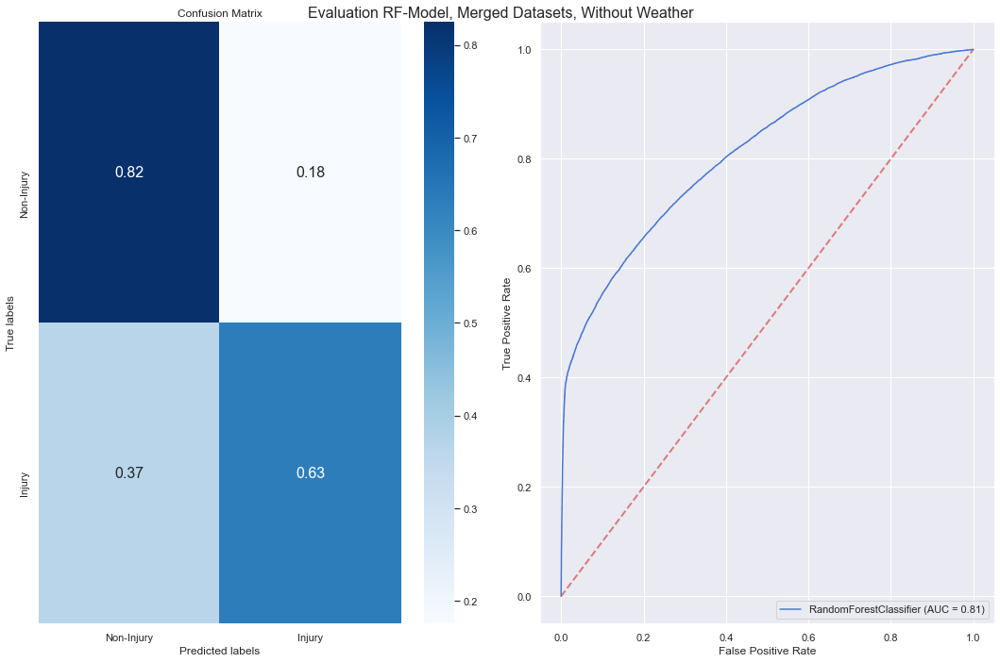

Feature 0: LATITUDE, SCORE 0.08
Feature 1: LONGITUDE, SCORE 0.08
Feature 2: PERSON_AGE1, SCORE 0.09
Feature 3: BOROUGH_0, SCORE 0.00
Feature 4: BOROUGH_1, SCORE 0.00
Feature 5: BOROUGH_2, SCORE 0.01
Feature 6: BOROUGH_3, SCORE 0.00
Feature 7: BOROUGH_4, SCORE 0.00
Feature 8: tod_0, SCORE 0.00
Feature 9: tod_1, SCORE 0.00
Feature 10: tod_2, SCORE 0.00
Feature 11: tod_3, SCORE 0.00
Feature 12: tod_4, SCORE 0.00
Feature 13: tod_5, SCORE 0.00
Feature 14: tod_6, SCORE 0.00
Feature 15: tod_7, SCORE 0.00
Feature 16: tod_8, SCORE 0.00
Feature 17: tod_9, SCORE 0.00
Feature 18: tod_10, SCORE 0.00
Feature 19: tod_11, SCORE 0.00
Feature 20: tod_12, SCORE 0.00
Feature 21: tod_13, SCORE 0.00
Feature 22: tod_14, SCORE 0.00
Feature 23: tod_15, SCORE 0.00
Feature 24: tod_16, SCORE 0.00
Feature 25: tod_17, SCORE 0.00
Feature 26: tod_18, SCORE 0.00
Feature 27: tod_19, SCORE 0.00
Feature 28: tod_20, SCORE 0.00
Feature 29: tod_21, SCORE 0.00
Feature 30: tod_22, SCORE 0.00
Feature 31: tod_23, SCORE 0.00
Fea

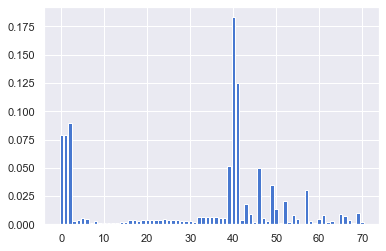

In [462]:
evaluate(rf_random_tot,X_test,y_test)

## Merging Weather 

In [54]:
import datetime

In [55]:
df_weather = pd.read_csv('Weather_Data.csv')
df_weather['datetime']=pd.to_datetime(df_weather['datetime'])

In [56]:
df_weather

,Unnamed: 0,humidity,datetime,Temp,wind_direction,weather_description,wind_speed
0,1,58.0,2012-10-01 13:00:00,288.220000,260.0,cloudy,7.0
1,2,57.0,2012-10-01 14:00:00,288.247676,260.0,cloudy,7.0
2,3,57.0,2012-10-01 15:00:00,288.326940,260.0,cloudy,7.0
3,4,57.0,2012-10-01 16:00:00,288.406203,260.0,cloudy,7.0
4,5,57.0,2012-10-01 17:00:00,288.485467,261.0,cloudy,6.0
...,...,...,...,...,...,...,...
43624,44456,36.0,2017-10-27 20:00:00,289.980000,0.0,sun,3.0
43625,44457,38.0,2017-10-27 21:00:00,289.480000,0.0,sun,1.0
43626,44458,54.0,2017-10-27 22:00:00,287.920000,196.0,sun,2.0
43627,44459,62.0,2017-10-27 23:00:00,285.830000,171.0,sun,3.0


In [57]:
df_merged = df_merged[df_merged['CRASH DATE'] != 'Unspecified']
df_merged = df_merged[df_merged['CRASH TIME'] != 'Unspecified']
df_merged['CRASH TIME'] = df_merged['CRASH TIME'].dt.time

In [58]:
df_merged['datetime'] = pd.to_datetime(df_merged['CRASH DATE'].astype(str)+' '+df_merged['CRASH TIME'].astype(str))

In [59]:
df_m = df_merged
df_weather = df_weather.set_index('datetime')
df_m['datetime'] = df_m['datetime'].dt.round(freq = 'H')
df_m = df_m.set_index('datetime')
# df_m.index = df_m.index.tz_convert(None)

In [66]:
df_m_w = pd.merge(df_m,df_weather, how='inner', left_index=True, right_index=True)

## ML model inc. Weather

In [420]:
X = df_m_w[['tod','dow','BOROUGH','CONTRIBUTING FACTOR VEHICLE 1','LATITUDE','LONGITUDE','PERSON_TYPE','PERSON_AGE1','VEHICLE TYPE CODE 1','NUMBER OF PERSONS INJURED','humidity','Temp','wind_direction','weather_description','wind_speed']]
print('X Shape {}'.format(X.shape))
X = X.reset_index()
X = X.drop(columns=['datetime'])
X['NUMBER OF PERSONS INJURED'] = X['NUMBER OF PERSONS INJURED'].apply(lambda x: 0 if x == 'Unspecified' else x)
X['NUMBER OF PERSONS INJURED'] = pd.to_numeric(X['NUMBER OF PERSONS INJURED'])
X['NUMBER OF PERSONS INJURED'] = X['NUMBER OF PERSONS INJURED'].apply(lambda x: 1 if x > 0 else x)

X Shape (468468, 15)


In [421]:
focusviolations = set(df_m_w.groupby(df_m_w['CONTRIBUTING FACTOR VEHICLE 1']).size().sort_values(ascending=False).index.to_list()[1:15])
focusvehicles = set(df_m_w.groupby(df_m_w['VEHICLE TYPE CODE 1']).size().sort_values(ascending=False).index.to_list()[1:16])

X = X[X['CONTRIBUTING FACTOR VEHICLE 1'].isin(focusviolations)]
X= X[X['VEHICLE TYPE CODE 1'].isin(focusvehicles)]
print('X shape {}'.format(X.shape))

X shape (111866, 15)


In [422]:
X = X[~X.isin(['Unspecified'])]
X = X.dropna()
print('Shape {}'.format(X.shape))
# X = X[X['PERSON_SEX1'] != 'U']
print('Shape {}'.format(X.shape))

Shape (74053, 15)
Shape (74053, 15)


In [423]:
X.groupby('PERSON_TYPE').size()

PERSON_TYPE
Bicyclist      4919
Occupant      59930
Pedestrian     9204
dtype: int64

In [424]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
X['CONTRIBUTING FACTOR VEHICLE 1'] = labelencoder.fit_transform(X['CONTRIBUTING FACTOR VEHICLE 1'])
X['BOROUGH'] = labelencoder.fit_transform(X['BOROUGH'])
X['PERSON_TYPE'] = labelencoder.fit_transform(X['PERSON_TYPE'])
# X['PERSON_SEX1'] = labelencoder.fit_transform(X['PERSON_SEX1'])
X['VEHICLE TYPE CODE 1'] = labelencoder.fit_transform(X['VEHICLE TYPE CODE 1'])
X['weather_description'] = labelencoder.fit_transform(X['weather_description'])


In [425]:
X['PERSON_TYPE'] = pd.to_numeric(X['PERSON_TYPE'])
X['CONTRIBUTING FACTOR VEHICLE 1'] = pd.to_numeric(X['CONTRIBUTING FACTOR VEHICLE 1'])
X['PERSON_AGE1'] = pd.to_numeric(X['PERSON_AGE1'])
# X['PERSON_SEX1'] = pd.to_numeric(X['PERSON_SEX1'])
X['BOROUGH'] = pd.to_numeric(X['BOROUGH'])
X['tod'] = pd.to_numeric(X['tod'])
X['dow'] = pd.to_numeric(X['dow'])
X['LATITUDE'] = pd.to_numeric(X['LATITUDE'])
X['LONGITUDE'] = pd.to_numeric(X['LONGITUDE'])
X['NUMBER OF PERSONS INJURED'] = pd.to_numeric(X['NUMBER OF PERSONS INJURED'])

In [426]:
print(X.groupby(['NUMBER OF PERSONS INJURED']).size())
mi = min(X.groupby('NUMBER OF PERSONS INJURED').size())
ma = max(X.groupby('NUMBER OF PERSONS INJURED').size())
X = X.drop(X[X['NUMBER OF PERSONS INJURED']==0].sample(frac=(1-(mi/ma))).index)

X.groupby(['NUMBER OF PERSONS INJURED']).size()


NUMBER OF PERSONS INJURED
0.0    43199
1.0    30854
dtype: int64


NUMBER OF PERSONS INJURED
0.0    30854
1.0    30854
dtype: int64

In [427]:
y = X['NUMBER OF PERSONS INJURED']
X = X.drop(columns=['NUMBER OF PERSONS INJURED'])

In [428]:
X = pd.get_dummies(X,columns=['tod','dow','BOROUGH','weather_description','CONTRIBUTING FACTOR VEHICLE 1','VEHICLE TYPE CODE 1','PERSON_TYPE'])
print('X shape',X.shape)

X shape (61708, 83)


In [429]:
header = X.columns.values.tolist()

X = X.values
y = y.values

In [430]:
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)
X = (X - X_mean) / X_std

In [431]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [432]:
from sklearn.decomposition import PCA

clf = LogisticRegression()
clf.fit(X_train,y_train)

prediction = clf.predict(X_test)

accuracy_score(y_test,prediction)

0.7899725004910627

In [433]:
# importance = clf.coef_[0]
# # summarize feature importance
# for i,v in enumerate(importance):
#     print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
# # plot feature importance
# plt.bar([x for x in range(len(importance))], importance)
# plt.show()

In [434]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

clf = RandomForestClassifier(n_estimators = 50)
clf.fit(X_train,y_train)
prediction = clf.predict(X_test)
accuracy_score(y_test,prediction)

0.797878609310548

Feature 0: LATITUDE, SCORE 0.06
Feature 1: LONGITUDE, SCORE 0.06
Feature 2: PERSON_AGE1, SCORE 0.12
Feature 3: humidity, SCORE 0.05
Feature 4: Temp, SCORE 0.06
Feature 5: wind_direction, SCORE 0.05
Feature 6: wind_speed, SCORE 0.03
Feature 7: tod_0, SCORE 0.00
Feature 8: tod_1, SCORE 0.00
Feature 9: tod_2, SCORE 0.00
Feature 10: tod_3, SCORE 0.00
Feature 11: tod_4, SCORE 0.00
Feature 12: tod_5, SCORE 0.00
Feature 13: tod_6, SCORE 0.00
Feature 14: tod_7, SCORE 0.00
Feature 15: tod_8, SCORE 0.00
Feature 16: tod_9, SCORE 0.00
Feature 17: tod_10, SCORE 0.00
Feature 18: tod_11, SCORE 0.00
Feature 19: tod_12, SCORE 0.00
Feature 20: tod_13, SCORE 0.00
Feature 21: tod_14, SCORE 0.00
Feature 22: tod_15, SCORE 0.01
Feature 23: tod_16, SCORE 0.01
Feature 24: tod_17, SCORE 0.01
Feature 25: tod_18, SCORE 0.00
Feature 26: tod_19, SCORE 0.00
Feature 27: tod_20, SCORE 0.00
Feature 28: tod_21, SCORE 0.00
Feature 29: tod_22, SCORE 0.00
Feature 30: tod_23, SCORE 0.00
Feature 31: dow_0, SCORE 0.01
Feature

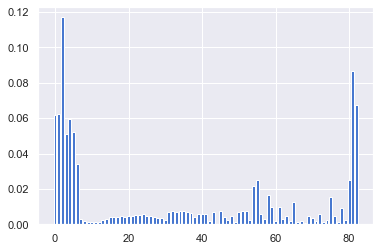

In [435]:
importance = clf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [437]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random_tot = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 1, cv = 2, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random_tot.fit(X_train, y_train)

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:   15.0s finished


RandomizedSearchCV(cv=2, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

### Confusion Matrix

Accuracy score: 0.8043
Log loss of the model given the test labels
Log loss error: 0.4282
              precision    recall  f1-score   support

         0.0       0.77      0.88      0.82     10176
         1.0       0.86      0.73      0.79     10188

    accuracy                           0.80     20364
   macro avg       0.81      0.80      0.80     20364
weighted avg       0.81      0.80      0.80     20364



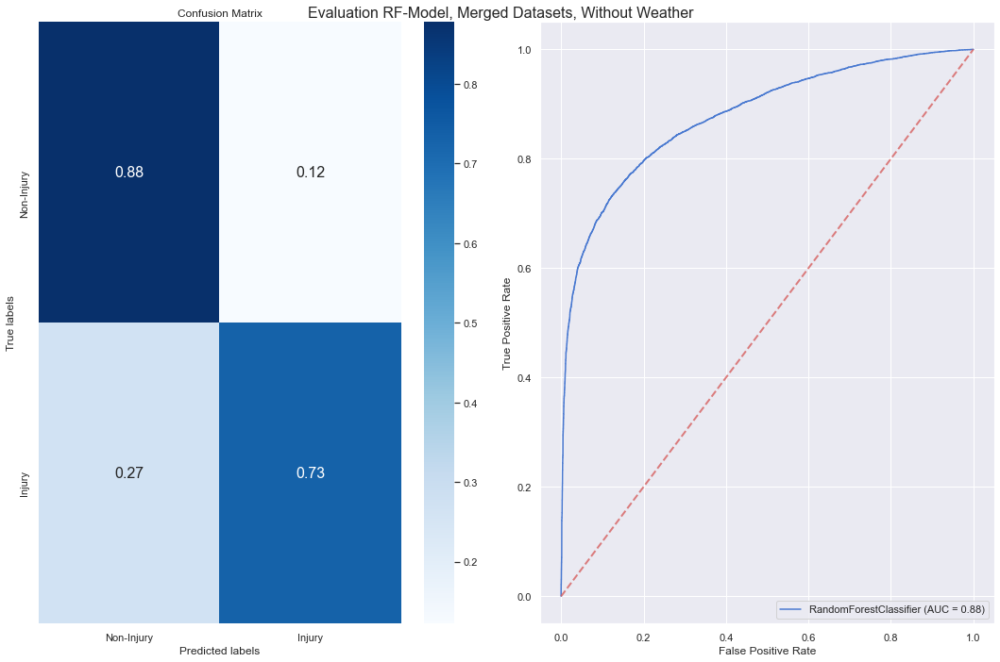

Feature 0: LATITUDE, SCORE 0.04
Feature 1: LONGITUDE, SCORE 0.04
Feature 2: PERSON_AGE1, SCORE 0.16
Feature 3: humidity, SCORE 0.03
Feature 4: Temp, SCORE 0.04
Feature 5: wind_direction, SCORE 0.03
Feature 6: wind_speed, SCORE 0.02
Feature 7: tod_0, SCORE 0.00
Feature 8: tod_1, SCORE 0.00
Feature 9: tod_2, SCORE 0.00
Feature 10: tod_3, SCORE 0.00
Feature 11: tod_4, SCORE 0.00
Feature 12: tod_5, SCORE 0.00
Feature 13: tod_6, SCORE 0.00
Feature 14: tod_7, SCORE 0.00
Feature 15: tod_8, SCORE 0.00
Feature 16: tod_9, SCORE 0.00
Feature 17: tod_10, SCORE 0.00
Feature 18: tod_11, SCORE 0.00
Feature 19: tod_12, SCORE 0.00
Feature 20: tod_13, SCORE 0.00
Feature 21: tod_14, SCORE 0.00
Feature 22: tod_15, SCORE 0.00
Feature 23: tod_16, SCORE 0.00
Feature 24: tod_17, SCORE 0.00
Feature 25: tod_18, SCORE 0.00
Feature 26: tod_19, SCORE 0.00
Feature 27: tod_20, SCORE 0.00
Feature 28: tod_21, SCORE 0.00
Feature 29: tod_22, SCORE 0.00
Feature 30: tod_23, SCORE 0.00
Feature 31: dow_0, SCORE 0.00
Feature

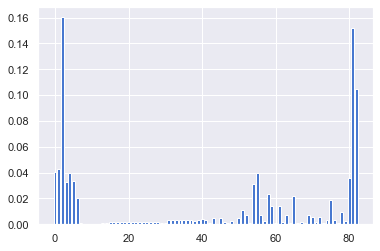

In [438]:
evaluate(rf_random_tot,X_test,y_test)

### uSING THE MODEL

In [439]:
X_test_n = X_test*X_std+X_mean

In [ ]:
Temp = np.vstack(((X_test_n[:,1].T-273.15),prediction,y_test)).T
df_Temp = pd.DataFrame({'temp': Temp[:, 0], 'pred': Temp[:, 1],'y_test': Temp[:,2]})
df_T = df_Temp.where(cond=(df_Temp['pred']==df_Temp['y_test'])).dropna()
df_TF = df_Temp.where(cond=(df_Temp['pred']!=df_Temp['y_test'])).dropna()

In [121]:
Temp = np.vstack(((X_test_n[:,1].T-273.15),prediction,y_test)).T
df_Temp = pd.DataFrame({'temp': Temp[:, 0], 'pred': Temp[:, 1],'y_test': Temp[:,2]})
df_T = df_Temp.where(cond=(df_Temp['pred']==df_Temp['y_test'])).dropna()
df_TF = df_Temp.where(cond=(df_Temp['pred']!=df_Temp['y_test'])).dropna()

In [122]:
Hum = np.vstack((X_test_n[:,0],prediction,y_test)).T
df_Hum = pd.DataFrame({'Hum': Hum[:, 0], 'pred': Hum[:, 1],'y_test': Hum[:,2]})
df_H = df_Hum.where(cond=(df_Hum['pred']==df_Hum['y_test'])).dropna()
df_HF = df_Hum.where(cond=(df_Hum['pred']!=df_Hum['y_test'])).dropna()

In [123]:
Ws = np.vstack((X_test_n[:,3],prediction,y_test)).T
df_Ws = pd.DataFrame({'Ws': Ws[:, 0], 'pred': Ws[:, 1],'y_test': Hum[:,2]})
df_W = df_Ws.where(cond=(df_Ws['pred']==df_Ws['y_test'])).dropna()
df_WF = df_Ws.where(cond=(df_Ws['pred']!=df_Ws['y_test'])).dropna()

In [124]:
from bokeh.io import output_file, show
from bokeh.models import ColumnDataSource, Legend
from bokeh.palettes import Spectral6
from bokeh.plotting import figure
from bokeh.transform import factor_cmap, linear_cmap,jitter
from bokeh.layouts import row, column
from bokeh.io import output_notebook, show, push_notebook

In [118]:
output_notebook()

Loading BokehJS ...

In [125]:
source = ColumnDataSource(df_T)
source2 = ColumnDataSource(df_TF)
p_T = figure(plot_width=700, plot_height=300, title="Temperature Injury Predictions",toolbar_location="left")
c1 = p_T.circle(x='temp', y=jitter('pred', width=0.7),source=source, alpha=0.1,color='green')
c2 = p_T.circle(x='temp', y=jitter('pred', width=0.7),source=source2, alpha=0.1,color='red')
p_T.ygrid.grid_line_color = None
p_T.xaxis.axis_label = "Temp"
p_T.legend.location = "center"
p_T.legend.orientation = "horizontal"
legend = Legend(items=[
    ("Predicted Correctly"   , [c1]),
    ("Predicted Wrong" , [c2])
], location="center")
p_T.add_layout(legend, 'right')
p_T.legend.click_policy="hide"
p_T.yaxis.major_label_overrides = {0: 'Non-Injury', 0.5:'', 1: 'Injury'}
p_T.yaxis.major_label_orientation = "vertical"
# show(p_T)

In [126]:
source = ColumnDataSource(df_H)
source2 = ColumnDataSource(df_HF)
p_H = figure(plot_width=700, plot_height=300, title="Humidity Injury Predictions",toolbar_location="left")
c1 = p_H.circle(x='Hum', y=jitter('pred', width=0.7),source=source, alpha=0.1,color='green')
c2 = p_H.circle(x='Hum', y=jitter('pred', width=0.7),source=source2, alpha=0.1,color='red')
p_H.ygrid.grid_line_color = None
p_H.xaxis.axis_label = "Humidity"
p_H.legend.location = "center"
p_H.legend.orientation = "horizontal"
legend = Legend(items=[
    ("Predicted Correctly"   , [c1]),
    ("Predicted Wrong" , [c2])
], location="center")
p_H.add_layout(legend, 'right')
p_H.legend.click_policy="hide"
p_H.yaxis.major_label_overrides = {0: 'Non-Injury', 0.5:'', 1: 'Injury'}
p_H.yaxis.major_label_orientation = "vertical"
# show(p_H)

In [127]:
source5 = ColumnDataSource(df_W)
source6 = ColumnDataSource(df_WF)
p_Ws = figure(plot_width=700, plot_height=300, title="Wind Speed Injury Predictions",toolbar_location="left")
c1 = p_Ws.circle(x=jitter('Ws',width=0.6), y=jitter('pred', width=0.7),source=source5, alpha=0.1,color='green')
c2 = p_Ws.circle(x=jitter('Ws',width=0.6), y=jitter('pred', width=0.7),source=source6, alpha=0.1,color='red')
p_Ws.ygrid.grid_line_color = None
p_Ws.xaxis.axis_label = "Wind Speed"
p_Ws.legend.location = "center"
p_Ws.legend.orientation = "horizontal"
legend = Legend(items=[
    ("Predicted Correctly"   , [c1]),
    ("Predicted Wrong" , [c2])
], location="center")
p_Ws.add_layout(legend, 'right')
p_Ws.legend.click_policy="hide"
p_Ws.yaxis.major_label_overrides = {0: 'Non-Injury', 0.5:'', 1: 'Injury'}
p_Ws.yaxis.major_label_orientation = "vertical"
# show(p_Ws)

In [128]:
show(column(p_T,p_H,p_Ws))

# Non personal ML model with weather

In [288]:
X = df_m_w[['tod','dow','BOROUGH','LATITUDE','LONGITUDE','NUMBER OF PERSONS INJURED','humidity','Temp','wind_direction','weather_description','wind_speed']]
print('X Shape {}'.format(X.shape))
X = X.reset_index()
X = X.drop(columns=['datetime'])

X Shape (468468, 11)


In [289]:
X['NUMBER OF PERSONS INJURED'] = X['NUMBER OF PERSONS INJURED'].apply(lambda x: 0 if x == 'Unspecified' else x)
X['NUMBER OF PERSONS INJURED'] = pd.to_numeric(X['NUMBER OF PERSONS INJURED'])
X['NUMBER OF PERSONS INJURED'] = X['NUMBER OF PERSONS INJURED'].apply(lambda x: 1 if x > 0 else x)

In [290]:
X = X[~X.isin(['Unspecified'])]
X = X.dropna()
print('Shape {}'.format(X.shape))

Shape (334427, 11)


In [291]:
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
X['BOROUGH'] = labelencoder.fit_transform(X['BOROUGH'])
# X['PERSON_TYPE'] = labelencoder.fit_transform(X['PERSON_TYPE'])
X['weather_description'] = labelencoder.fit_transform(X['weather_description'])

In [292]:
X['BOROUGH'] = pd.to_numeric(X['BOROUGH'])
X['tod'] = pd.to_numeric(X['tod'])
X['dow'] = pd.to_numeric(X['dow'])
X['LATITUDE'] = pd.to_numeric(X['LATITUDE'])
X['LONGITUDE'] = pd.to_numeric(X['LONGITUDE'])
X['NUMBER OF PERSONS INJURED'] = pd.to_numeric(X['NUMBER OF PERSONS INJURED'])

In [293]:
print(X.groupby(['NUMBER OF PERSONS INJURED']).size())
mi = min(X.groupby('NUMBER OF PERSONS INJURED').size())
ma = max(X.groupby('NUMBER OF PERSONS INJURED').size())
X = X.drop(X[X['NUMBER OF PERSONS INJURED']==0].sample(frac=(1-(mi/ma))).index)

X.groupby(['NUMBER OF PERSONS INJURED']).size()

NUMBER OF PERSONS INJURED
0.0    179352
1.0    155075
dtype: int64


NUMBER OF PERSONS INJURED
0.0    155075
1.0    155075
dtype: int64

In [294]:
y = X['NUMBER OF PERSONS INJURED']
X = X.drop(columns=['NUMBER OF PERSONS INJURED'])

In [295]:
X = pd.get_dummies(X,columns=['tod','dow','BOROUGH','weather_description'])
print('X shape',X.shape)

header = X.columns.values.tolist()

X shape (310150, 50)


In [296]:
X = X.values
y = y.values

In [297]:
X_mean = X.mean(axis=0)
X_std = X.std(axis=0)
X = (X - X_mean) / X_std

In [298]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [299]:
clf = LogisticRegression()
clf.fit(X_train,y_train)

prediction = clf.predict(X_test)

accuracy_score(y_test,prediction)

0.572066438690767

In [300]:
# importance = clf.coef_[0]
# # summarize feature importance
# for i,v in enumerate(importance):
#     print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
# # plot feature importance
# plt.bar([x for x in range(len(importance))], importance)
# plt.show()

In [301]:
clf = RandomForestClassifier(n_estimators = 50)
clf.fit(X_train,y_train)
prediction = clf.predict(X_test)
accuracy_score(y_test,prediction)

0.7480019540791402

Feature 0: LATITUDE, SCORE 0.15
Feature 1: LONGITUDE, SCORE 0.15
Feature 2: humidity, SCORE 0.11
Feature 3: Temp, SCORE 0.14
Feature 4: wind_direction, SCORE 0.11
Feature 5: wind_speed, SCORE 0.07
Feature 6: tod_0, SCORE 0.01
Feature 7: tod_1, SCORE 0.00
Feature 8: tod_2, SCORE 0.00
Feature 9: tod_3, SCORE 0.00
Feature 10: tod_4, SCORE 0.00
Feature 11: tod_5, SCORE 0.00
Feature 12: tod_6, SCORE 0.00
Feature 13: tod_7, SCORE 0.00
Feature 14: tod_8, SCORE 0.01
Feature 15: tod_9, SCORE 0.01
Feature 16: tod_10, SCORE 0.00
Feature 17: tod_11, SCORE 0.01
Feature 18: tod_12, SCORE 0.01
Feature 19: tod_13, SCORE 0.01
Feature 20: tod_14, SCORE 0.01
Feature 21: tod_15, SCORE 0.01
Feature 22: tod_16, SCORE 0.01
Feature 23: tod_17, SCORE 0.01
Feature 24: tod_18, SCORE 0.01
Feature 25: tod_19, SCORE 0.01
Feature 26: tod_20, SCORE 0.01
Feature 27: tod_21, SCORE 0.01
Feature 28: tod_22, SCORE 0.01
Feature 29: tod_23, SCORE 0.00
Feature 30: dow_0, SCORE 0.01
Feature 31: dow_1, SCORE 0.01
Feature 32: d

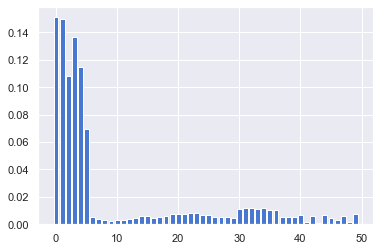

In [302]:
importance = clf.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
    print('Feature {}: {}, SCORE {:.2f}'.format(i,header[i],v))
# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

Fitting 2 folds for each of 1 candidates, totalling 2 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:  1.4min finished


Accuracy score: 0.7194
Log loss of the model given the test labels
Log loss error: 0.5854
              precision    recall  f1-score   support

         0.0       0.71      0.75      0.73     51405
         1.0       0.73      0.68      0.71     50945

    accuracy                           0.72    102350
   macro avg       0.72      0.72      0.72    102350
weighted avg       0.72      0.72      0.72    102350



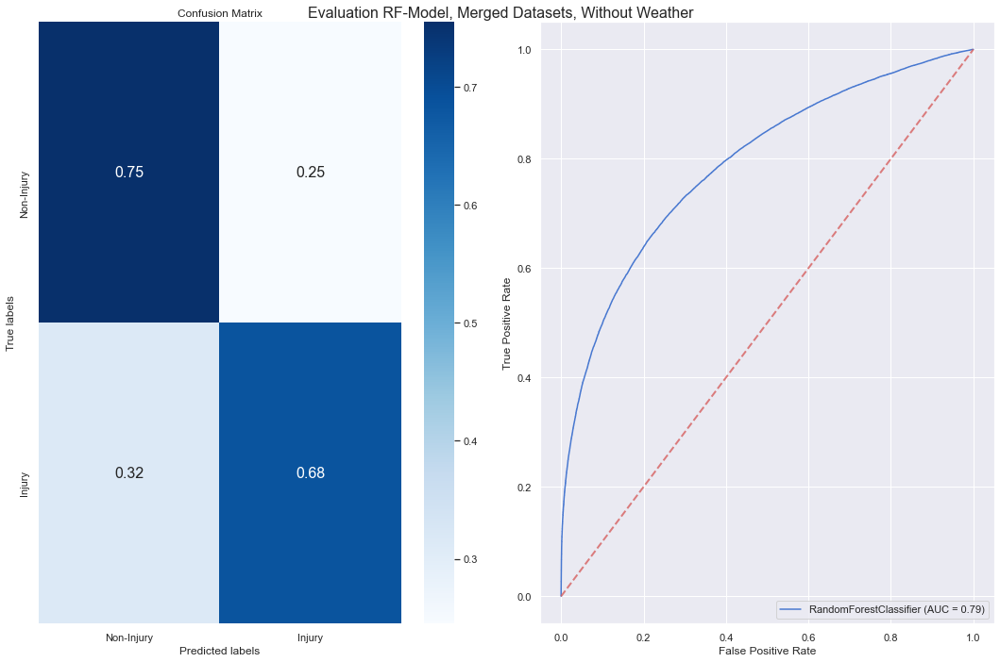

Feature 0: LATITUDE, SCORE 0.13
Feature 1: LONGITUDE, SCORE 0.12
Feature 2: humidity, SCORE 0.12
Feature 3: Temp, SCORE 0.16
Feature 4: wind_direction, SCORE 0.13
Feature 5: wind_speed, SCORE 0.08
Feature 6: tod_0, SCORE 0.00
Feature 7: tod_1, SCORE 0.00
Feature 8: tod_2, SCORE 0.00
Feature 9: tod_3, SCORE 0.00
Feature 10: tod_4, SCORE 0.00
Feature 11: tod_5, SCORE 0.00
Feature 12: tod_6, SCORE 0.00
Feature 13: tod_7, SCORE 0.00
Feature 14: tod_8, SCORE 0.01
Feature 15: tod_9, SCORE 0.00
Feature 16: tod_10, SCORE 0.00
Feature 17: tod_11, SCORE 0.00
Feature 18: tod_12, SCORE 0.01
Feature 19: tod_13, SCORE 0.01
Feature 20: tod_14, SCORE 0.01
Feature 21: tod_15, SCORE 0.01
Feature 22: tod_16, SCORE 0.01
Feature 23: tod_17, SCORE 0.01
Feature 24: tod_18, SCORE 0.01
Feature 25: tod_19, SCORE 0.01
Feature 26: tod_20, SCORE 0.01
Feature 27: tod_21, SCORE 0.00
Feature 28: tod_22, SCORE 0.00
Feature 29: tod_23, SCORE 0.00
Feature 30: dow_0, SCORE 0.01
Feature 31: dow_1, SCORE 0.01
Feature 32: d

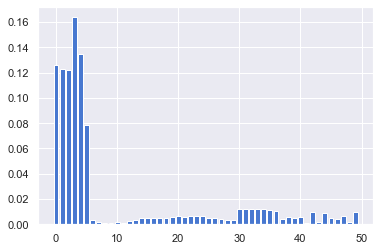

In [303]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random_tot = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 1, cv = 2, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random_tot.fit(X_train, y_train)

evaluate(rf_random_tot,X_test,y_test)

In [306]:
X_test_n = X_test*X_std+X_mean

In [309]:
correct = np.vstack(((X_test_n[:,0].T),(X_test_n[:,1].T),prediction,y_test)).T
df_cor = pd.DataFrame({'lat': correct[:, 0],'lon':correct[:,1], 'pred': correct[:, 2],'y_test': correct[:,3]})

In [310]:
df_cor

,lat,lon,pred,y_test
0,40.663334,-73.960236,0.0,0.0
1,40.692575,-73.858174,1.0,1.0
2,40.669113,-73.953360,1.0,0.0
3,40.748438,-73.984560,1.0,1.0
4,40.838323,-73.912738,1.0,1.0
...,...,...,...,...
102345,40.722498,-73.976893,1.0,1.0
102346,40.611460,-73.924370,1.0,0.0
102347,40.835636,-73.848070,1.0,0.0
102348,40.764732,-73.966370,1.0,1.0


In [311]:
df_c = df_cor.where(cond=(df_cor['pred']==df_cor['y_test'])).dropna()
df_w = df_cor.where(cond=(df_cor['pred']!=df_cor['y_test'])).dropna()

In [313]:
NYC = x_range, y_range = ((-74.05, -73.7), (40.6, 40.9))

In [317]:
from bokeh.io import output_notebook,curdoc, show,output_file
from datashader.colors import colormap_select, Greys9, Hot, viridis, inferno
from bokeh.models import HoverTool
from bokeh.models.widgets import Panel, Tabs
import hvplot.pandas
import hvplot
import holoviews as hv

In [337]:
m = df_c.hvplot.points(x='lon',y='lat',xlim=x_range,ylim=y_range
                 ,logz=True,width=700,height=500,cmap=inferno,datashade=True).opts(bgcolor='black',
                                                                                  title='Vehicle Collisions and Crashes')
m = df_w.hvplot.points(x='lon',y='lat',xlim=x_range,ylim=y_range
                 ,logz=True,width=700,height=500,cmap=Greys9,datashade=True).opts(bgcolor='black',
                                                                                  title='Vehicle Collisions and Crashes')

In [338]:
m

:DynamicMap   []
   :RGB   [lon,lat]   (R,G,B,A)

In [324]:
w = df_w.hvplot.points(x='lon',y='lat',xlim=x_range,ylim=y_range
                 ,logz=True,width=700,height=500,color=inferno,datashade=True).opts(bgcolor='black',
                                                                                  title='Vehicle Collisions and Crashes')


In [326]:
(m+w)

:Layout
   .DynamicMap.I  :DynamicMap   []
      :RGB   [lon,lat]   (R,G,B,A)
   .DynamicMap.II :DynamicMap   []
      :RGB   [lon,lat]   (R,G,B,A)

In [333]:
hvplot.points(x=df_w['lon'],y=df_w['lat'],xlim=x_range,ylim=y_range
                 ,logz=True,width=700,height=500,color=inferno,datashade=True).opts(bgcolor='black',
                                                                                  title='Vehicle Collisions and Crashes')


AttributeError: module 'hvplot' has no attribute 'points'

In [360]:

predict = prediction[0:10000]

mapz = folium.Map([40.730610, -73.935242], zoom_start=11)

for i in range(len(predict)):
    
    if predict[i] == y_test[i]:
        if predict[i] ==1:
            folium.CircleMarker([X_test_n[i,0], X_test_n[i,1]],fill=True, # Set fill to True
                                        fill_color='green',
                                        color = 'green',
                                       radius = 0.2
                ).add_to(mapz)         

#         if predict[i] ==0:
#             folium.CircleMarker([X_test_n[i,0], X_test_n[i,1]],fill=True, # Set fill to True
#                                         fill_color='blue',
#                                         color = 'blue',
#                                        radius = 0.2
#                 ).add_to(mapz)   
    elif predict[i] != y_test[i]:
        folium.CircleMarker([X_test_n[i,0], X_test_n[i,1]],fill=True, # Set fill to True
                                    fill_color='red',
                                    color = 'red',
                                    radius = 0.2

            ).add_to(mapz)
    
# Display map
mapz